In [1]:
import sys
sys.path.append('..')
from vis.visualization import visualize_activation, visualize_saliency, overlay
from vis.utils import utils
from keras import activations
from matplotlib import pyplot as plt
from keras import backend as K
import numpy as np
from src.data_prepare import *
from src.model_utils_keras import load_model_history
from vis.visualization import visualize_cam
from keras.preprocessing import image
from keras import models
import cv2
import matplotlib.cm as cm
from vis.visualization import visualize_cam

/home/cugtyt/software/miniconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


# Dense layer visualizations by keras-vis

## Vanilla adam

In [2]:
model, history = load_model_history('vanilla_adam_keras')

model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_15 (Conv2D)           (None, 128, 128, 32)      896       
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 128, 128, 32)      9248      
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 126, 126, 32)      9248      
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 63, 63, 32)        0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 63, 63, 32)        0         
_________________________________________________________________
conv2d_18 (Conv2D)           (None, 63, 63, 64)        18496     
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 63, 63, 64)        36928     
__________

/home/cugtyt/software/miniconda3/lib/python3.6/site-packages/keras/models.py:291: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


In [3]:
layer_idx = utils.find_layer_idx(model, 'dense_6')
model.layers[layer_idx].activation = activations.linear
model = utils.apply_modifications(model)

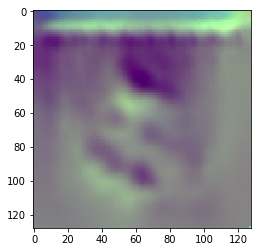

In [22]:
img = visualize_activation(model, layer_idx, filter_indices=None)

plt.imshow(img)

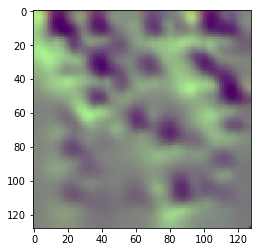

In [19]:
filter_idx = 0
img = visualize_activation(model, layer_idx, filter_indices=filter_idx)

plt.imshow(img)

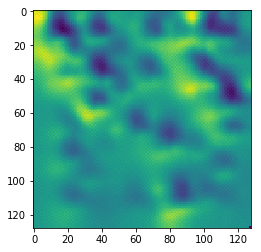

In [20]:
plt.imshow(img[..., 0])

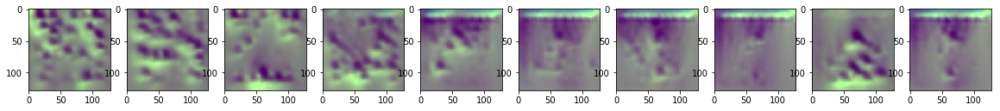

In [8]:
fig, axarr = plt.subplots(1, 10, figsize=(20, 5))
for filter_idx in range(10):
    img = visualize_activation(model, layer_idx, filter_indices=filter_idx)
    axarr[filter_idx].imshow(img)

## Resnet

In [9]:
model, history = load_model_history('resnet_keras')

model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 128, 128, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 128, 128, 32) 896         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 128, 128, 32) 9248        conv2d_1[0][0]                   
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 128, 128, 32) 128         conv2d_2[0][0]                   
__________________________________________________________________________________________________
activation

/home/cugtyt/software/miniconda3/lib/python3.6/site-packages/keras/models.py:291: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


In [10]:
layer_idx = utils.find_layer_idx(model, 'dense_2')
model.layers[layer_idx].activation = activations.linear
model = utils.apply_modifications(model)

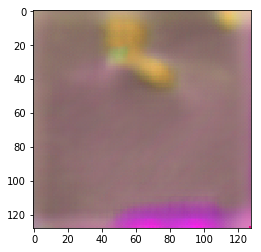

In [29]:
img = visualize_activation(model, layer_idx, filter_indices=None)

plt.imshow(img)

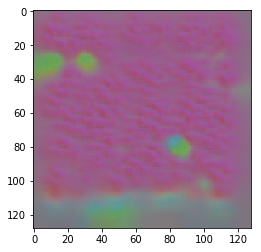

In [30]:
filter_idx = 0
img = visualize_activation(model, layer_idx, filter_indices=filter_idx)

plt.imshow(img)

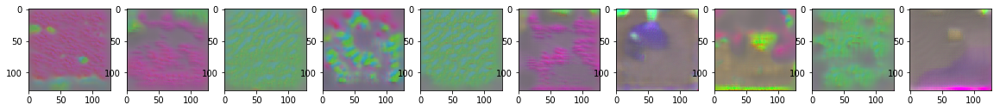

In [11]:
fig, axarr = plt.subplots(1, 10, figsize=(20, 5))
for filter_idx in range(10):
    img = visualize_activation(model, layer_idx, filter_indices=filter_idx)
    axarr[filter_idx].imshow(img)

## Densenet

In [12]:
model, history = load_model_history('densenet_keras')

model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 128, 128, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 128, 128, 32) 896         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 128, 128, 32) 128         conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 128, 128, 32) 0           batch_normalization_1[0][0]      
__________________________________________________________________________________________________
concatenat

/home/cugtyt/software/miniconda3/lib/python3.6/site-packages/keras/models.py:291: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


In [13]:
layer_idx = utils.find_layer_idx(model, 'dense_2')
model.layers[layer_idx].activation = activations.linear
model = utils.apply_modifications(model)

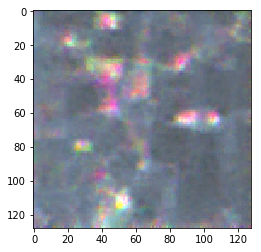

In [25]:
img = visualize_activation(model, layer_idx, filter_indices=None)

plt.imshow(img)

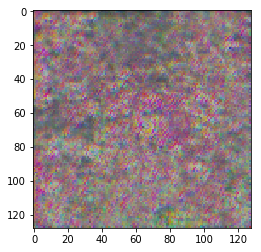

In [26]:
filter_idx = 0
img = visualize_activation(model, layer_idx, filter_indices=filter_idx)

plt.imshow(img)

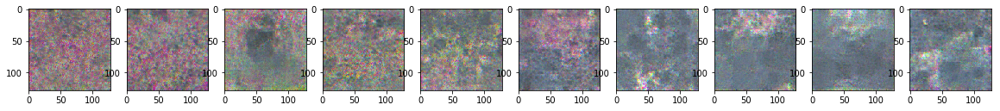

In [14]:
fig, axarr = plt.subplots(1, 10, figsize=(20, 5))
for filter_idx in range(10):
    img = visualize_activation(model, layer_idx, filter_indices=filter_idx)
    axarr[filter_idx].imshow(img)

## Densenet reduced 3

In [15]:
model, history = load_model_history('densenet_keras_reduced3')

model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_10 (InputLayer)           (None, 128, 128, 3)  0                                            
__________________________________________________________________________________________________
conv2d_34 (Conv2D)              (None, 128, 128, 16) 448         input_10[0][0]                   
__________________________________________________________________________________________________
batch_normalization_34 (BatchNo (None, 128, 128, 16) 64          conv2d_34[0][0]                  
__________________________________________________________________________________________________
activation_34 (Activation)      (None, 128, 128, 16) 0           batch_normalization_34[0][0]     
__________________________________________________________________________________________________
concatenat

In [16]:
layer_idx = utils.find_layer_idx(model, 'dense_20')
model.layers[layer_idx].activation = activations.linear
model = utils.apply_modifications(model)

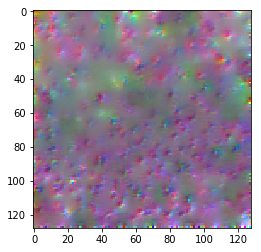

In [33]:
img = visualize_activation(model, layer_idx, filter_indices=None)

plt.imshow(img)

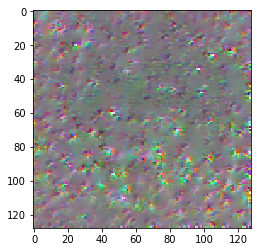

In [34]:
filter_idx = 0
img = visualize_activation(model, layer_idx, filter_indices=filter_idx)

plt.imshow(img)

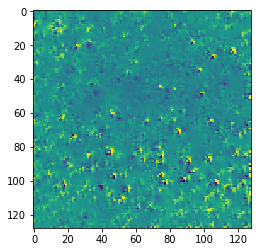

In [35]:
plt.imshow(img[..., 0])

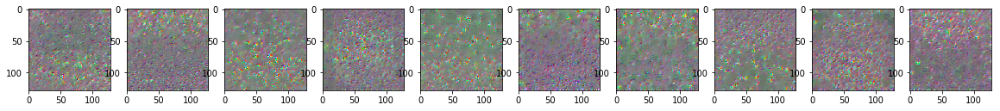

In [17]:
fig, axarr = plt.subplots(1, 10, figsize=(20, 5))
for filter_idx in range(10):
    img = visualize_activation(model, layer_idx, filter_indices=filter_idx)
    axarr[filter_idx].imshow(img)

### Specifying input_range

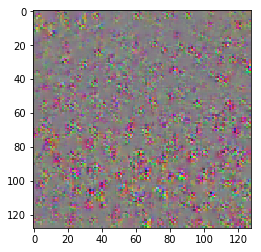

In [6]:
img = visualize_activation(model, layer_idx, filter_indices=filter_idx, input_range=(0., 1.))
plt.imshow(img)

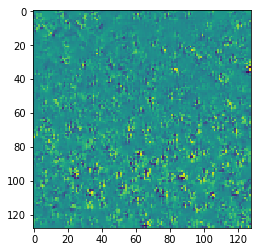

In [7]:
plt.imshow(img[..., 0])

# Attention (Saliency and grad-CAM) by keras-vis

## Saliency

In [2]:
train_data, test_data, train_label, test_label = avg_float_asian()
print(train_data.shape)
print(test_data.shape)

(1027, 128, 128, 3)
(257, 128, 128, 3)


In [3]:
model, history = load_model_history('densenet_keras_reduced3')

model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_10 (InputLayer)           (None, 128, 128, 3)  0                                            
__________________________________________________________________________________________________
conv2d_34 (Conv2D)              (None, 128, 128, 16) 448         input_10[0][0]                   
__________________________________________________________________________________________________
batch_normalization_34 (BatchNo (None, 128, 128, 16) 64          conv2d_34[0][0]                  
__________________________________________________________________________________________________
activation_34 (Activation)      (None, 128, 128, 16) 0           batch_normalization_34[0][0]     
__________________________________________________________________________________________________
concatenat

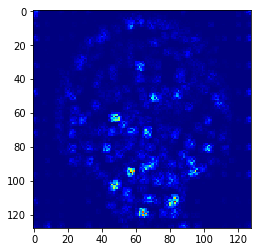

In [4]:
layer_idx = utils.find_layer_idx(model, 'dense_20')
class_idx = 2
indices = np.where(test_label == class_idx)[0]

# pick some random input from here.
idx = indices[0]
model.layers[layer_idx].activation = activations.linear
model = utils.apply_modifications(model)

grads = visualize_saliency(model, layer_idx, filter_indices=2, seed_input=test_data[idx])
plt.imshow(grads, cmap='jet')

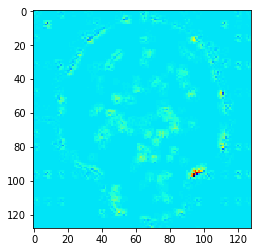

In [5]:
grads = visualize_saliency(model, layer_idx, filter_indices=2, seed_input=test_data[idx], 
                           backprop_modifier='guided', grad_modifier='negate')
plt.imshow(grads, cmap='jet')

In [16]:
def visualize_saliency_each_class(model, layer_name):
    for class_idx in range(10):    
        indices = np.where(test_label == class_idx)[0]
        idx = indices[0]
        layer_idx = utils.find_layer_idx(model, layer_name)
        
        f, ax = plt.subplots(1, 4)
        ax[0].imshow(test_data[idx][..., 0])

        for i, modifier in enumerate([None, 'guided', 'relu']):
            grads = visualize_saliency(model, layer_idx, filter_indices=class_idx, 
                                       seed_input=test_data[idx], backprop_modifier=modifier)
            if modifier is None:
                modifier = 'vanilla'
            ax[i+1].set_title(modifier)    
            ax[i+1].imshow(grads, cmap='jet')

/home/cugtyt/software/miniconda3/lib/python3.6/site-packages/keras/models.py:291: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


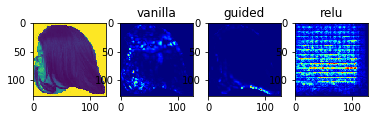

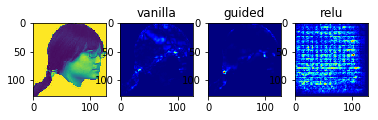

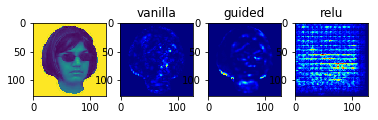

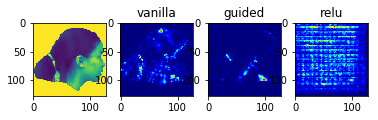

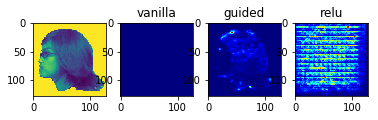

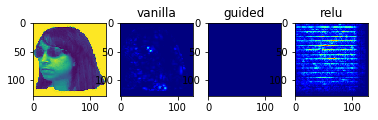

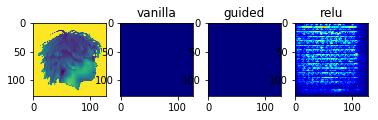

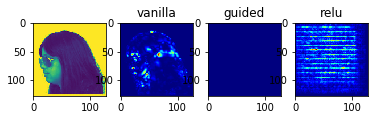

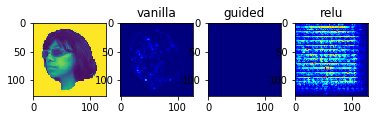

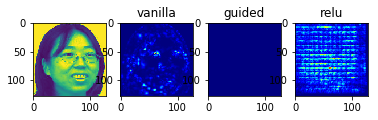

In [17]:
model, history = load_model_history('vanilla_adam_keras')
visualize_saliency_each_class(model, 'dense_6')

/home/cugtyt/software/miniconda3/lib/python3.6/site-packages/keras/models.py:291: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


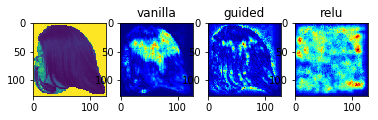

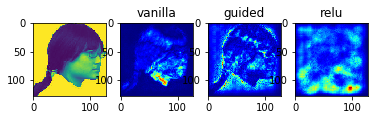

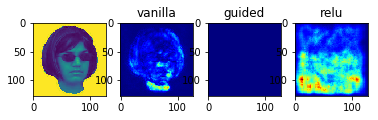

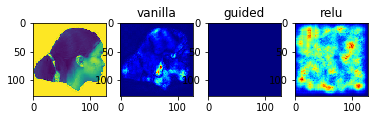

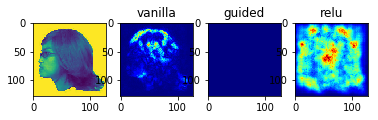

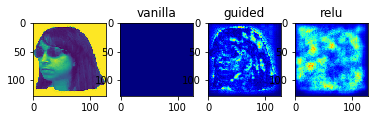

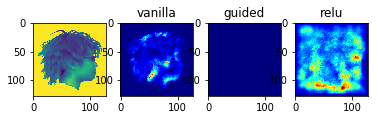

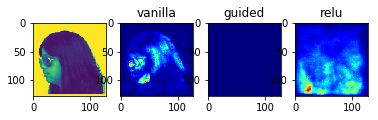

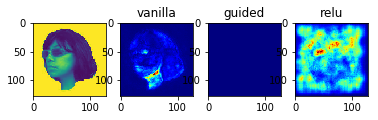

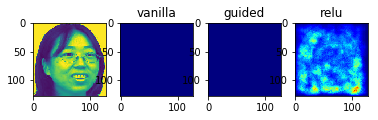

In [18]:
model, history = load_model_history('resnet_keras')
visualize_saliency_each_class(model, 'dense_2')

/home/cugtyt/software/miniconda3/lib/python3.6/site-packages/keras/models.py:291: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


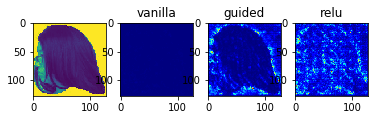

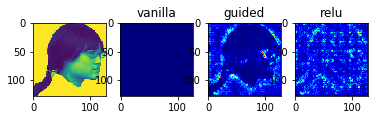

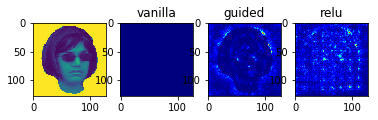

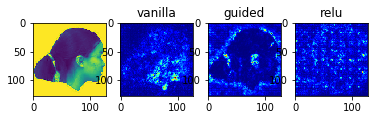

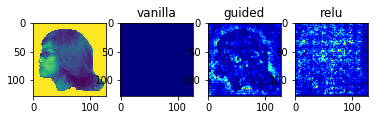

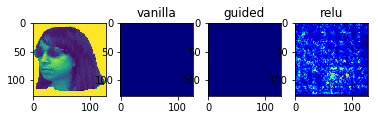

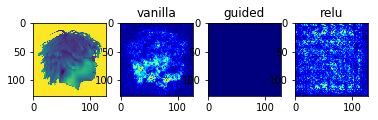

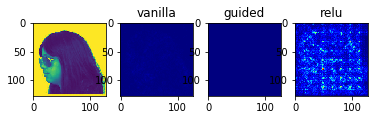

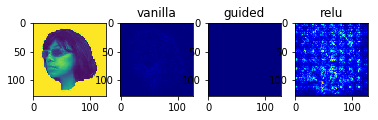

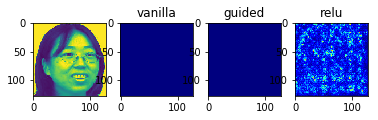

In [19]:
model, history = load_model_history('densenet_keras')
visualize_saliency_each_class(model, 'dense_2')

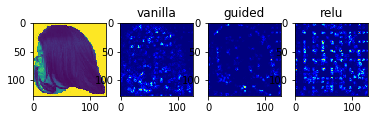

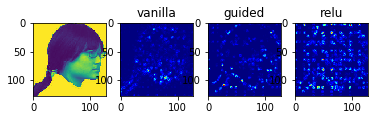

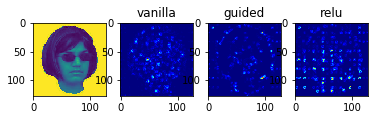

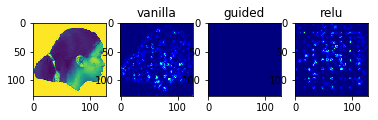

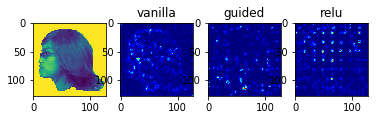

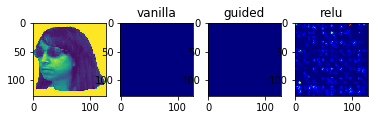

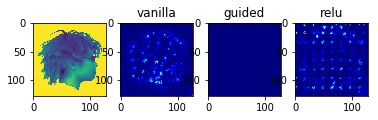

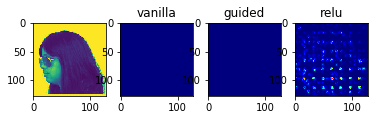

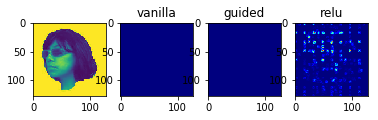

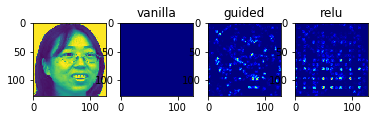

In [33]:
model, history = load_model_history('densenet_keras_reduced3')
visualize_saliency_each_class(model, 'dense_20')

## grad-CAM - vanilla, guided, rectified

In [20]:
def visualize_cam_each_class(model, layer_name):
    # This corresponds to the Dense linear layer.
    for class_idx in range(10):    
        indices = np.where(test_label == class_idx)[0]
        idx = indices[0]

        layer_idx = utils.find_layer_idx(model, layer_name)
        
        f, ax = plt.subplots(1, 4)
        ax[0].imshow(test_data[idx][..., 0])

        for i, modifier in enumerate([None, 'guided', 'relu']):
            grads = visualize_cam(model, layer_idx, filter_indices=class_idx, 
                                  seed_input=test_data[idx], backprop_modifier=modifier)     
            if modifier is None:
                modifier = 'vanilla'
            ax[i+1].set_title(modifier)    
            ax[i+1].imshow(grads, cmap='jet')

/home/cugtyt/software/miniconda3/lib/python3.6/site-packages/keras/models.py:291: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


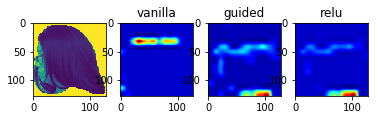

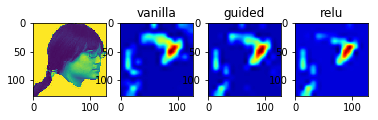

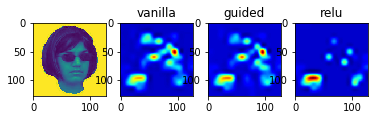

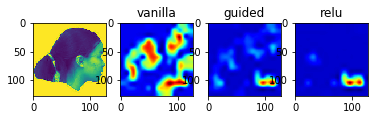

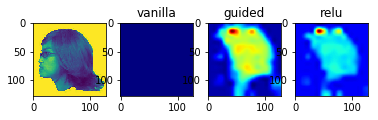

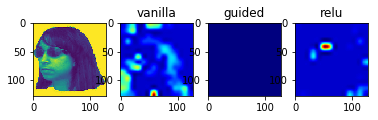

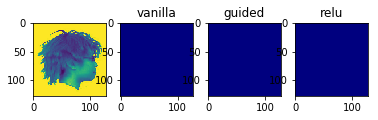

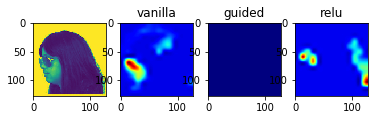

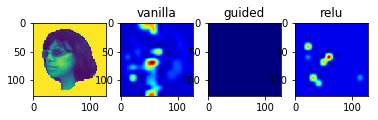

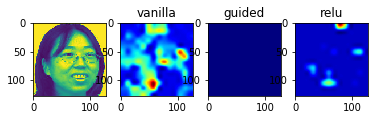

In [21]:
model, history = load_model_history('vanilla_adam_keras')
visualize_cam_each_class(model, 'dense_6')

/home/cugtyt/software/miniconda3/lib/python3.6/site-packages/keras/models.py:291: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


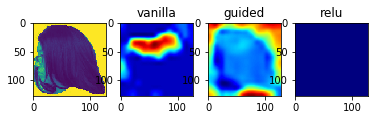

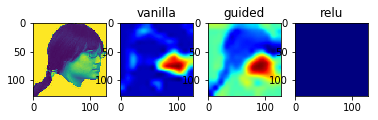

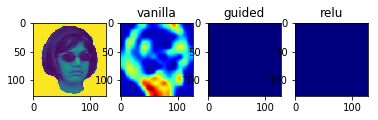

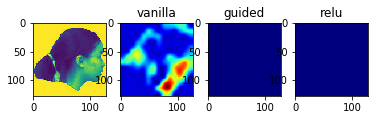

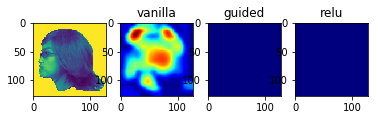

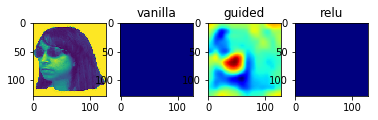

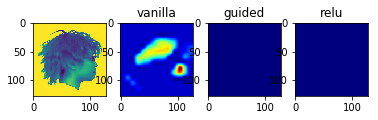

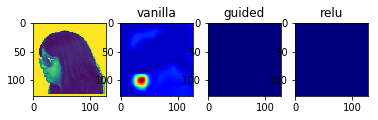

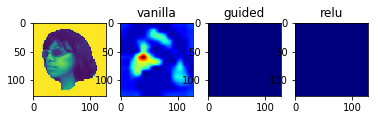

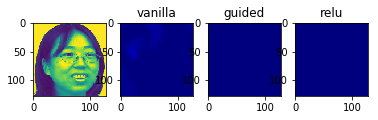

In [22]:
model, history = load_model_history('resnet_keras')
visualize_cam_each_class(model, 'dense_2')

/home/cugtyt/software/miniconda3/lib/python3.6/site-packages/keras/models.py:291: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


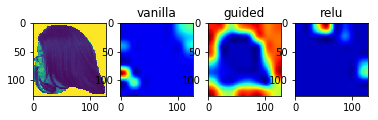

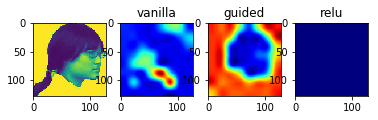

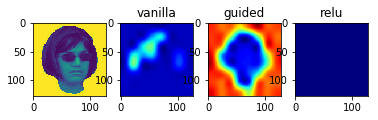

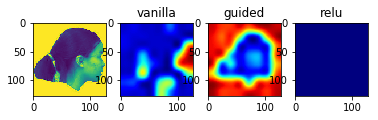

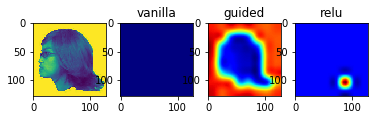

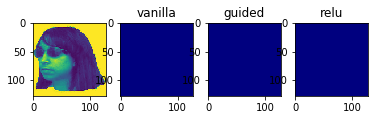

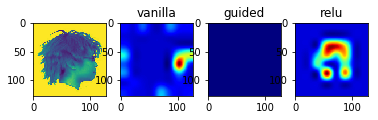

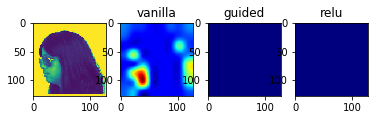

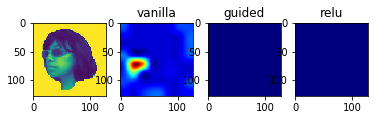

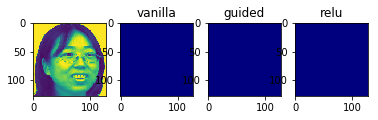

In [23]:
model, history = load_model_history('densenet_keras')
visualize_cam_each_class(model, 'dense_2')

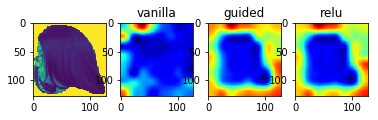

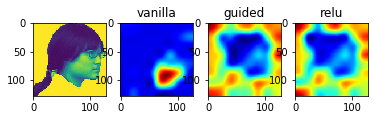

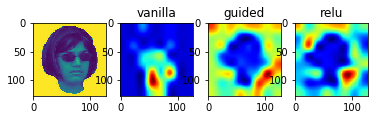

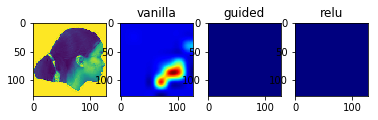

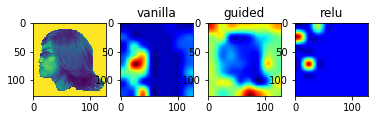

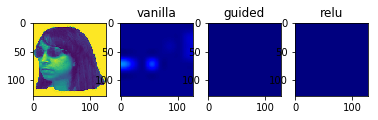

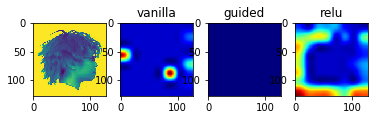

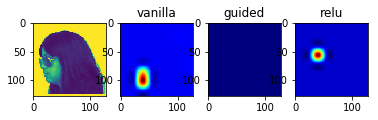

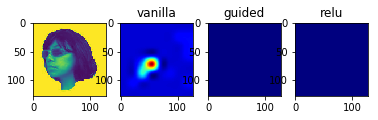

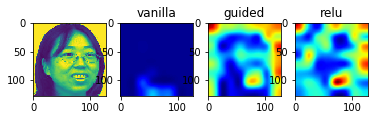

In [32]:
model, history = load_model_history('densenet_keras_reduced3')
visualize_cam_each_class(model, 'dense_20')

## Visualization without swapping softmax

In [26]:
def visual_no_swap_softmax(model, layer_name):
    layer_idx = utils.find_layer_idx(model, layer_name)
    model.layers[layer_idx].activation = activations.softmax
    model = utils.apply_modifications(model)
    
    for class_idx in range(10):    
        indices = np.where(test_label == class_idx)[0]
        idx = indices[0]

        grads = visualize_saliency(model, layer_idx, filter_indices=class_idx, 
                                   seed_input=test_data[idx], backprop_modifier='guided')

        f, ax = plt.subplots(1, 2)
        ax[0].imshow(test_data[idx][..., 0])
        ax[1].imshow(grads, cmap='jet')

/home/cugtyt/software/miniconda3/lib/python3.6/site-packages/keras/models.py:291: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


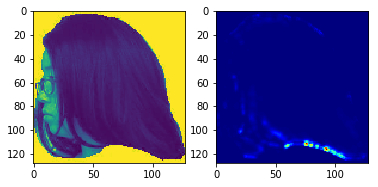

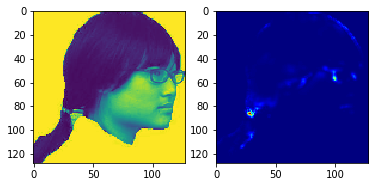

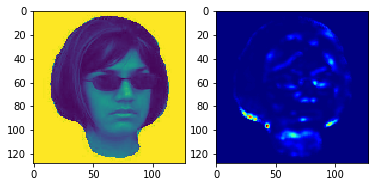

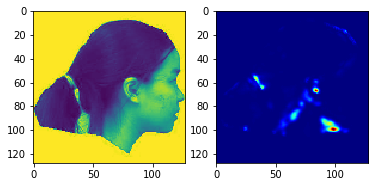

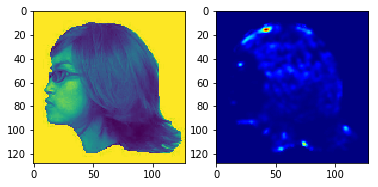

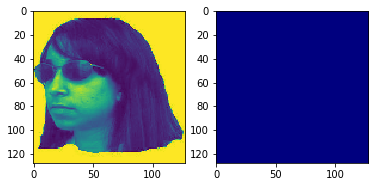

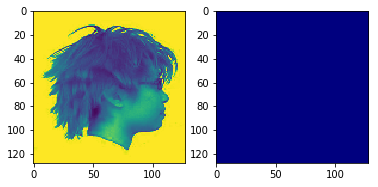

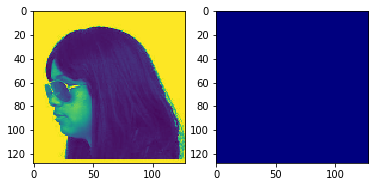

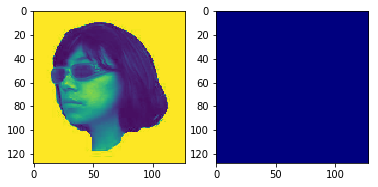

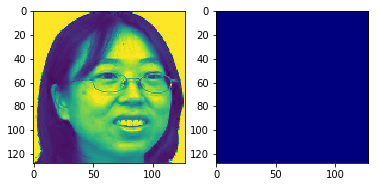

In [27]:
model, history = load_model_history('vanilla_adam_keras')
visual_no_swap_softmax(model, 'dense_6')

/home/cugtyt/software/miniconda3/lib/python3.6/site-packages/keras/models.py:291: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


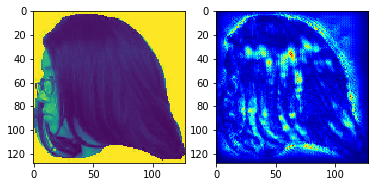

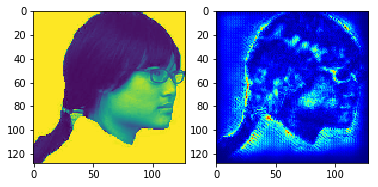

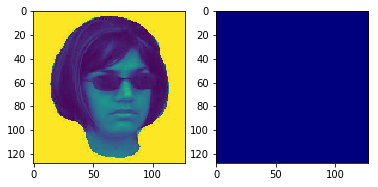

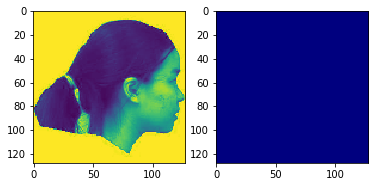

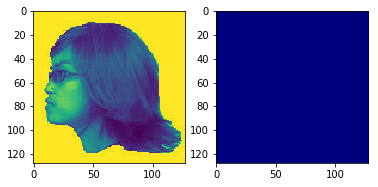

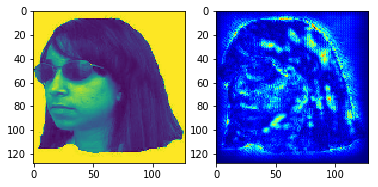

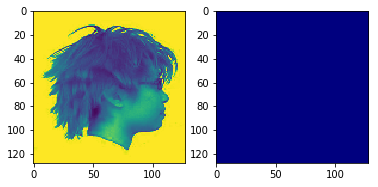

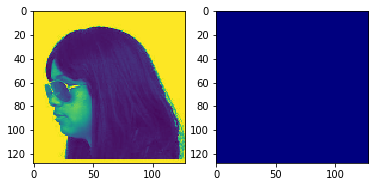

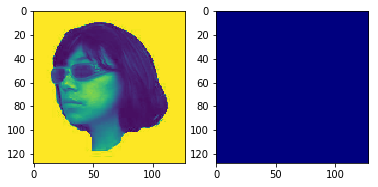

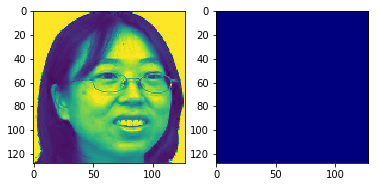

In [28]:
model, history = load_model_history('resnet_keras')
visual_no_swap_softmax(model, 'dense_2')

/home/cugtyt/software/miniconda3/lib/python3.6/site-packages/keras/models.py:291: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


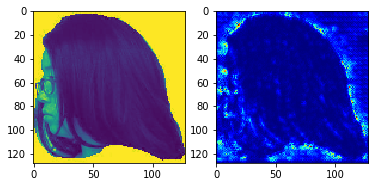

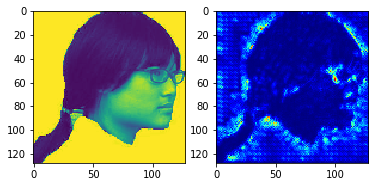

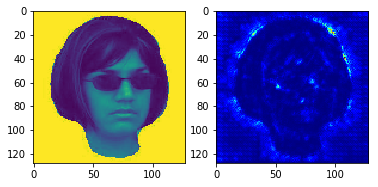

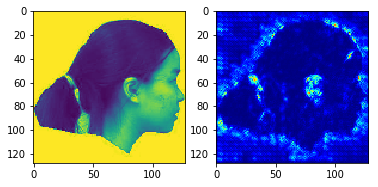

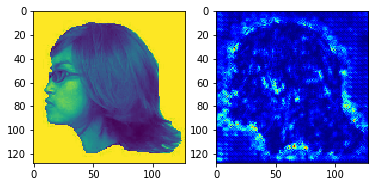

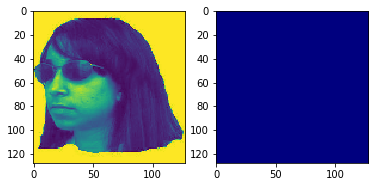

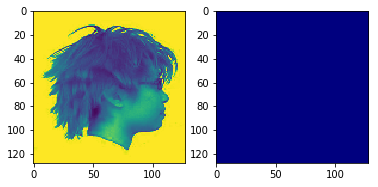

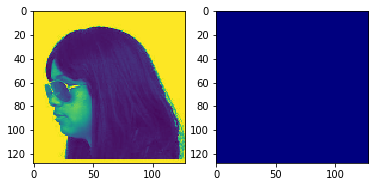

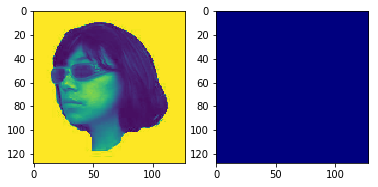

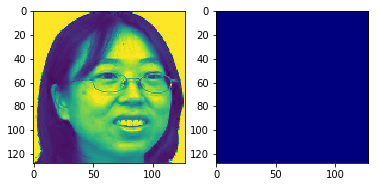

In [29]:
model, history = load_model_history('densenet_keras')
visual_no_swap_softmax(model, 'dense_2')

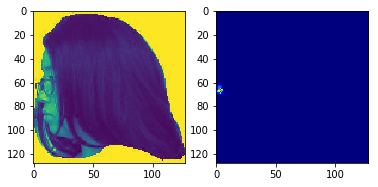

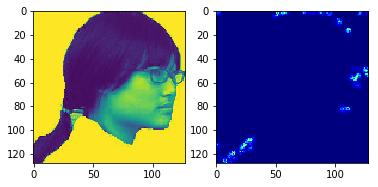

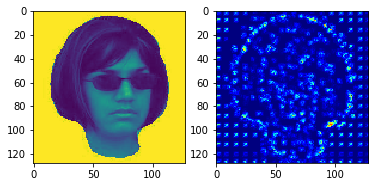

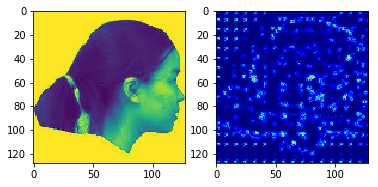

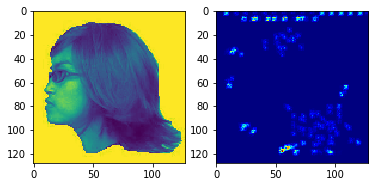

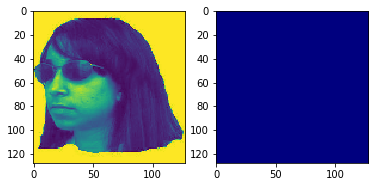

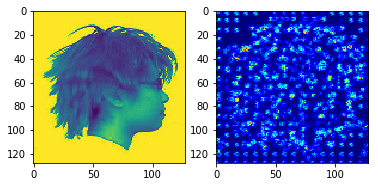

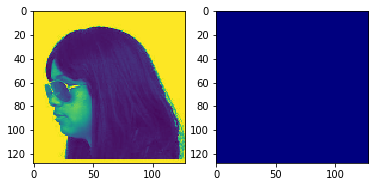

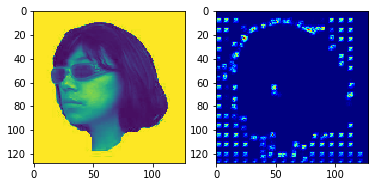

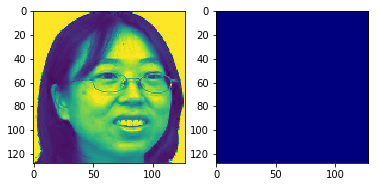

In [31]:
model, history = load_model_history('densenet_keras_reduced3')
visual_no_swap_softmax(model, 'conv2d_37')

# Visualizing what convnets learn by dl-py

In [42]:
def visual_convnet_learn(model, image_path='../../data/Asian/AF0301_1100_00F.jpg'):
    # image_path = '../../data/Asian/AF0301_1100_00F.jpg'

    img = image.load_img(image_path, target_size=(128, 128))
    img_tensor = np.expand_dims(image.img_to_array(img), axis=0) / 255

    # Extracts the outputs of the top 8 layers:
    layer_outputs = [layer.output for layer in model.layers[1:]]
    # Creates a model that will return these outputs, given the model input:
    activation_model = models.Model(inputs=model.input, outputs=layer_outputs)
    activations = activation_model.predict(img_tensor)

    first_layer_activation = activations[1]

    layer_names = []
    for layer in model.layers[1:]:
        layer_names.append(layer.name)


    images_per_row = 16

    # Now let's display our feature maps
    for layer_name, layer_activation in zip(layer_names, activations):
        if layer_name.startswith('flatten'):
            break
        # This is the number of features in the feature map
        n_features = layer_activation.shape[-1]
        # The feature map has shape (1, size, size, n_features)
        size = layer_activation.shape[1]
        # We will tile the activation channels in this matrix
        n_cols = n_features // images_per_row
        display_grid = np.zeros((size * n_cols, images_per_row * size))
        # We'll tile each filter into this big horizontal grid
        for col in range(n_cols):
            for row in range(images_per_row):
                channel_image = layer_activation[0, :, :, col * images_per_row + row]
                # Post-process the feature to make it visually palatable
                channel_image -= channel_image.mean()
                channel_image /= channel_image.std()
                channel_image *= 64
                channel_image += 128
                channel_image = np.clip(channel_image, 0, 255).astype('uint8')
                display_grid[col * size : (col + 1) * size,
                    row * size : (row + 1) * size] = channel_image
        # Display the grid
        scale = 1. / size
        plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
        plt.title(layer_name)
    #     plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')

/home/cugtyt/software/miniconda3/lib/python3.6/site-packages/keras/models.py:291: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '
/home/cugtyt/software/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


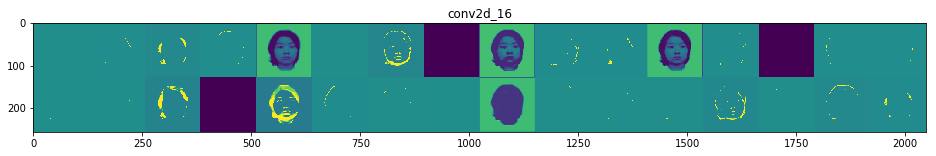

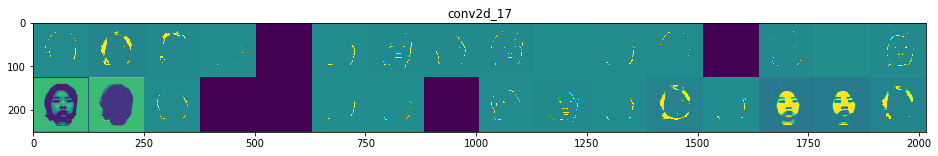

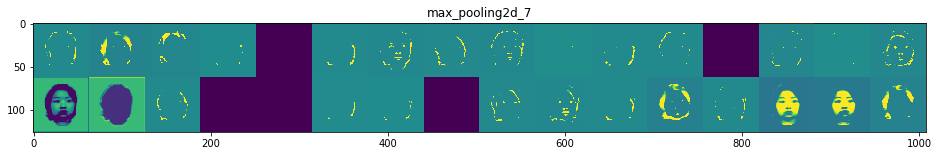

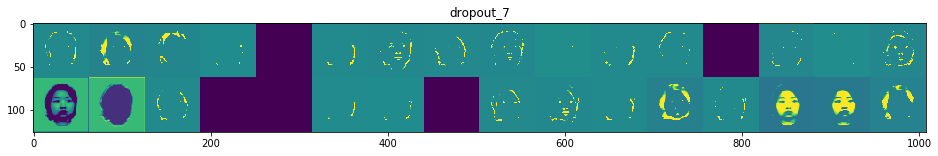

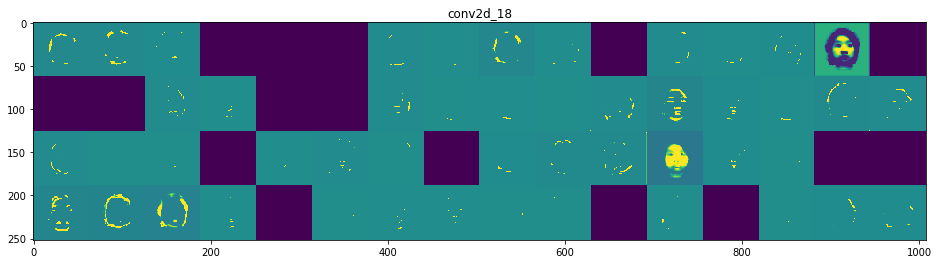

...

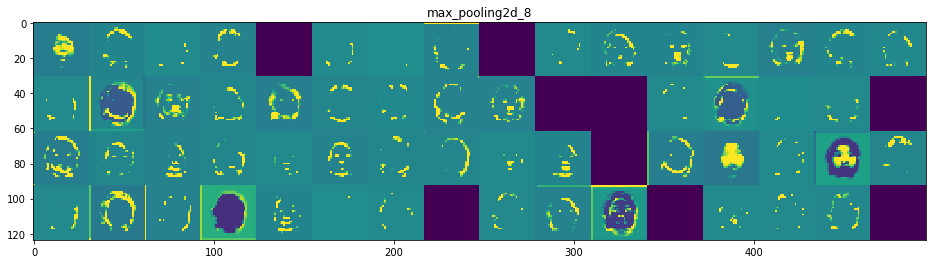

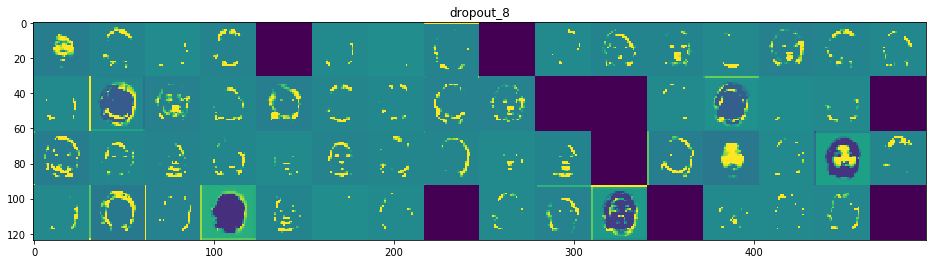

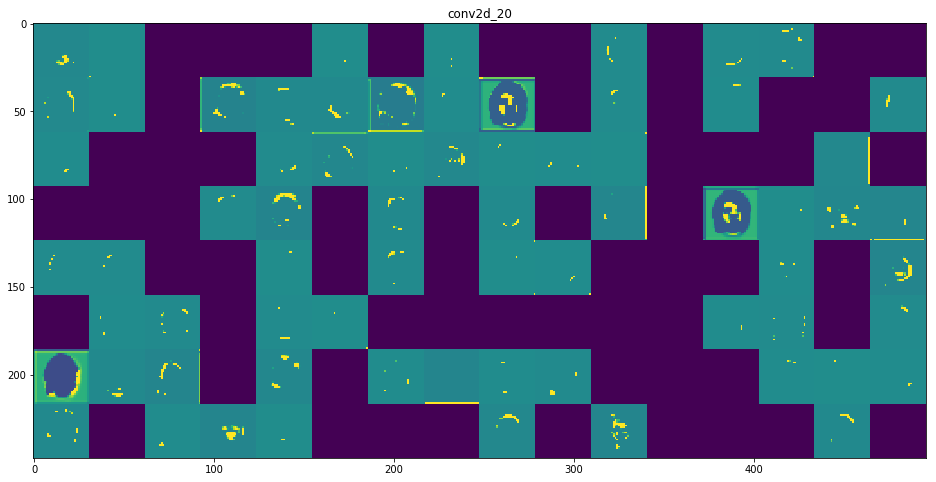

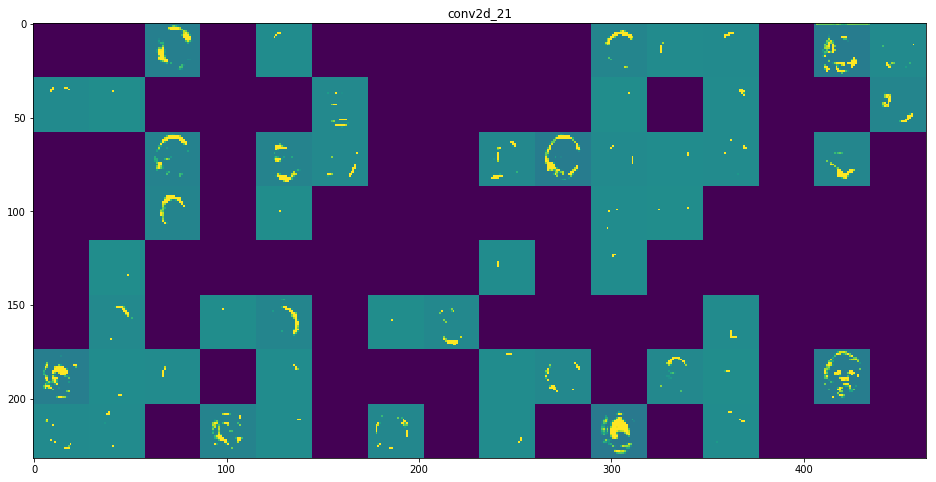

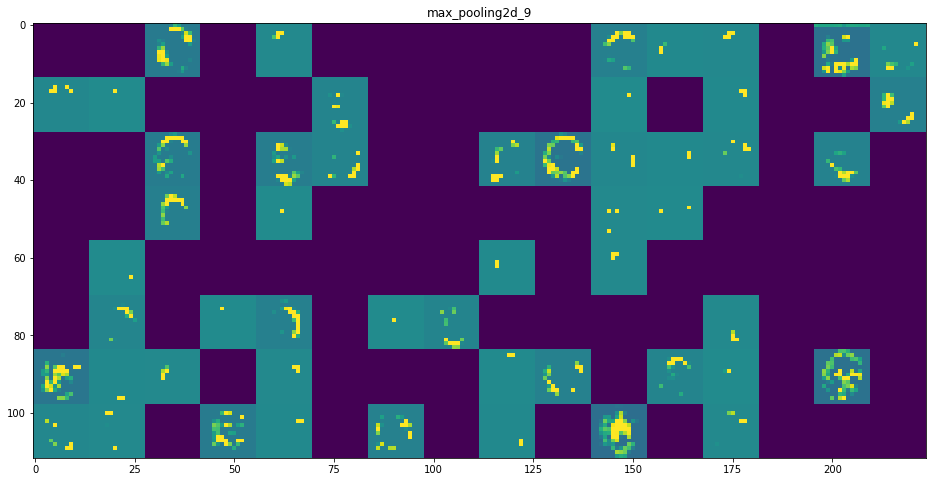

In [44]:
model, history = load_model_history('vanilla_adam_keras')
visual_convnet_learn(model)

/home/cugtyt/software/miniconda3/lib/python3.6/site-packages/keras/models.py:291: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '
/home/cugtyt/software/miniconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
/home/cugtyt/software/miniconda3/lib/python3.6/site-packages/ipykernel_launcher.py:39: RuntimeWarning: invalid value encountered in true_divide


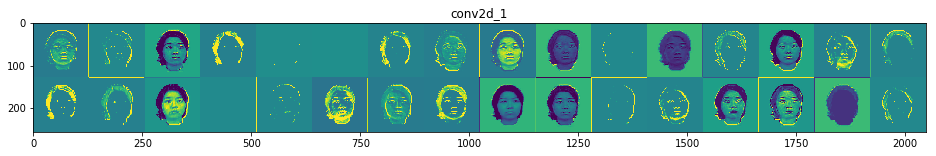

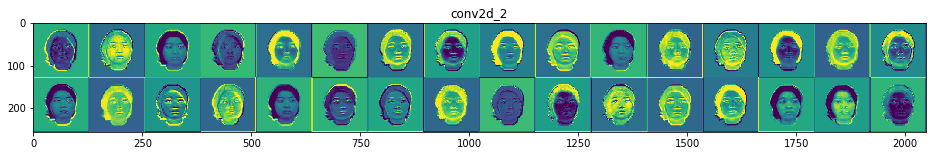

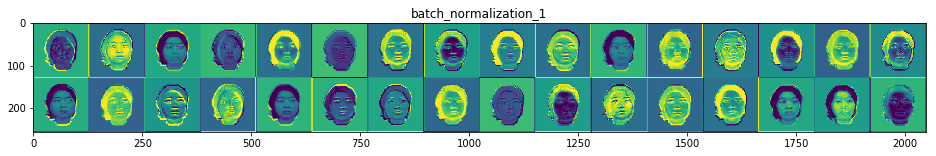

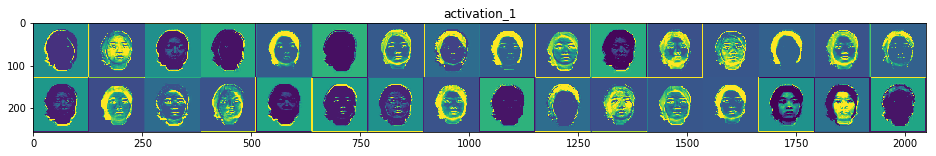

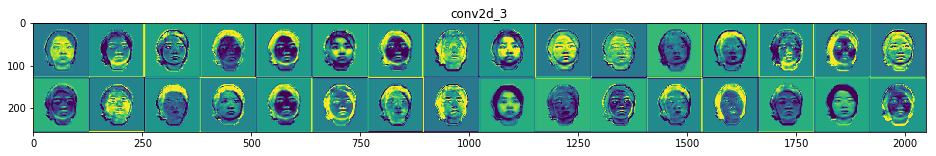

...

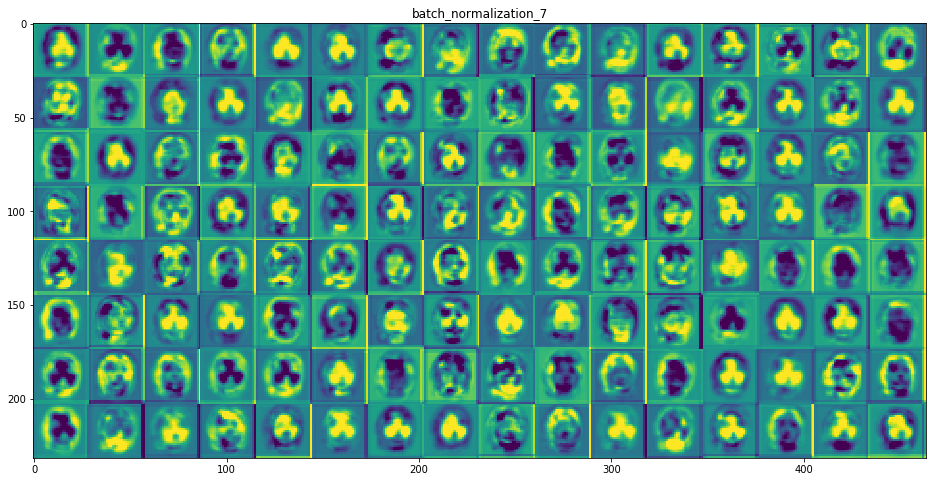

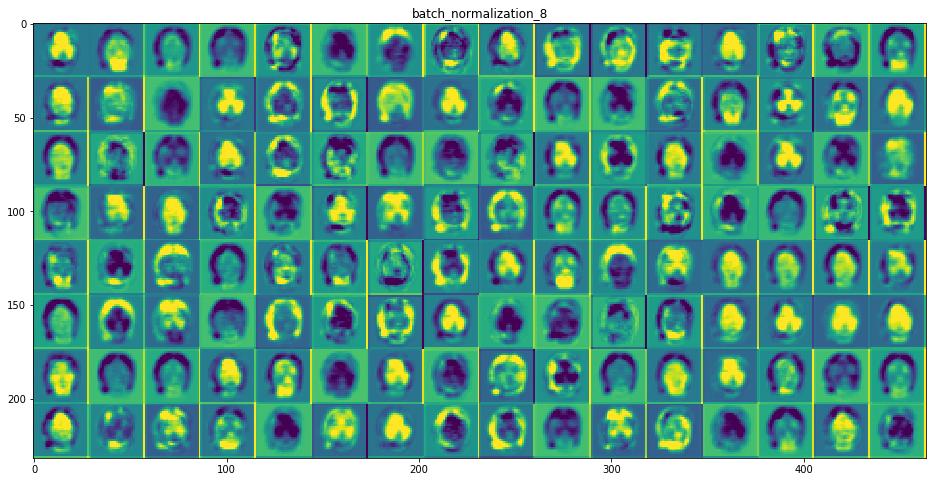

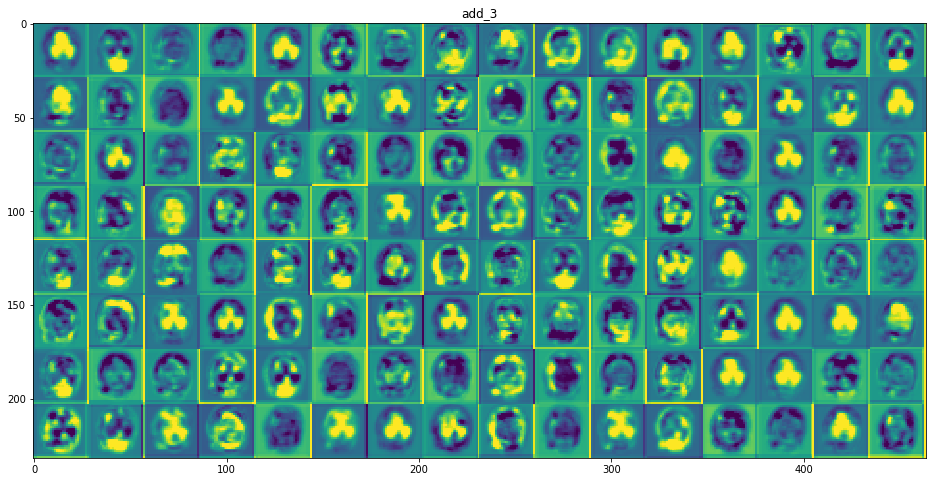

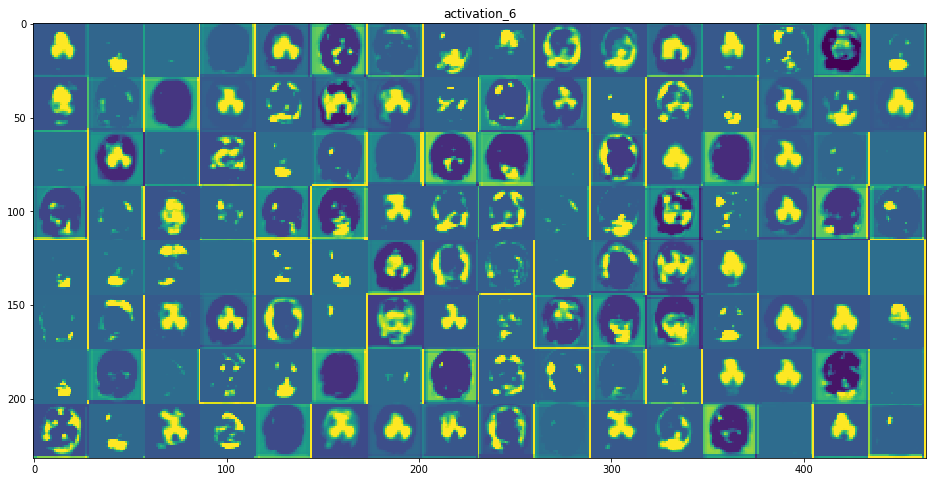

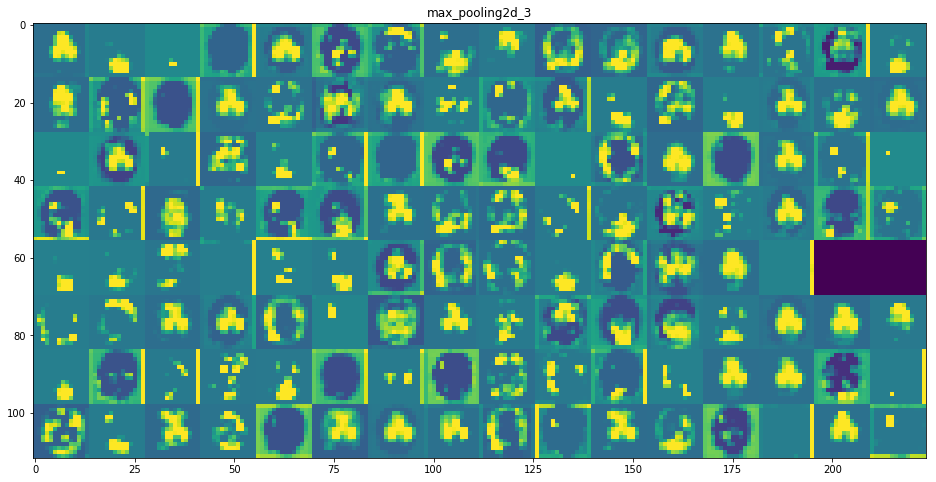

In [45]:
model, history = load_model_history('resnet_keras')
visual_convnet_learn(model)

/home/cugtyt/software/miniconda3/lib/python3.6/site-packages/keras/models.py:291: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '
/home/cugtyt/software/miniconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


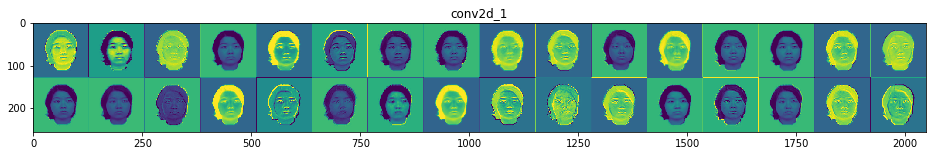

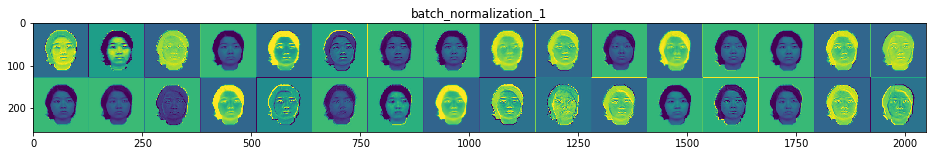

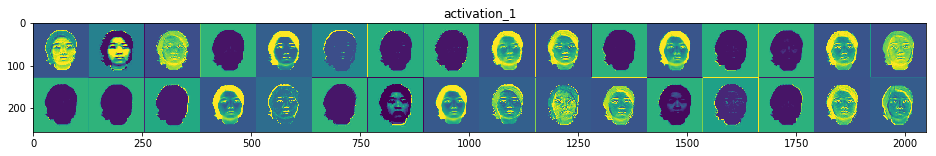

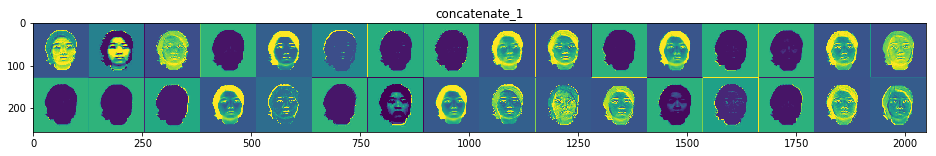

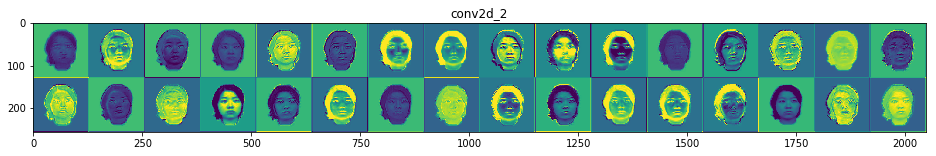

...

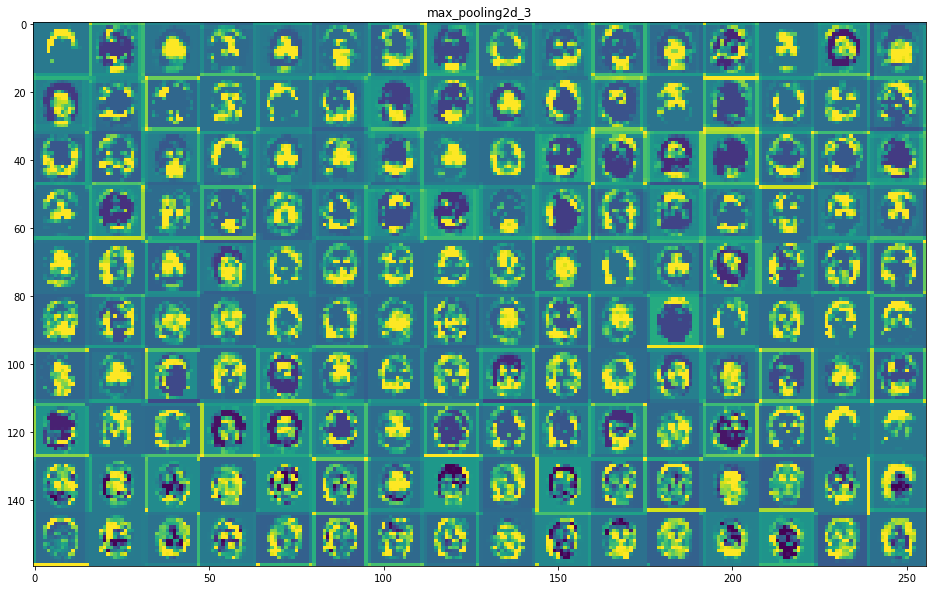

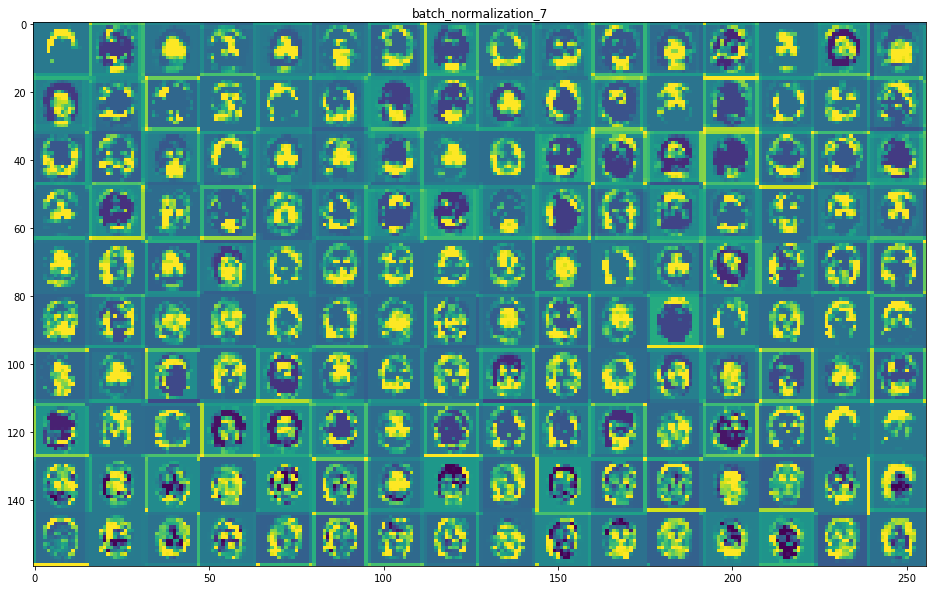

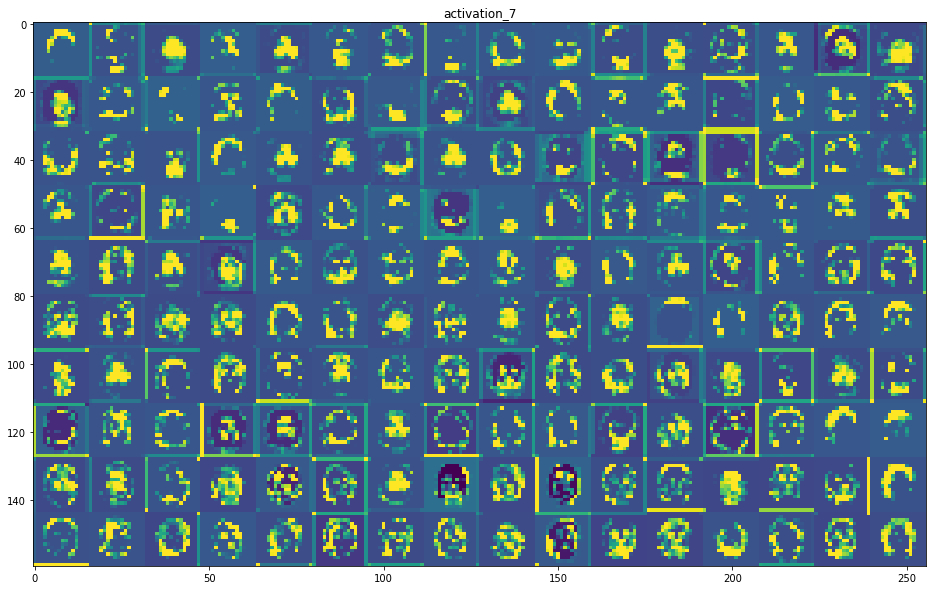

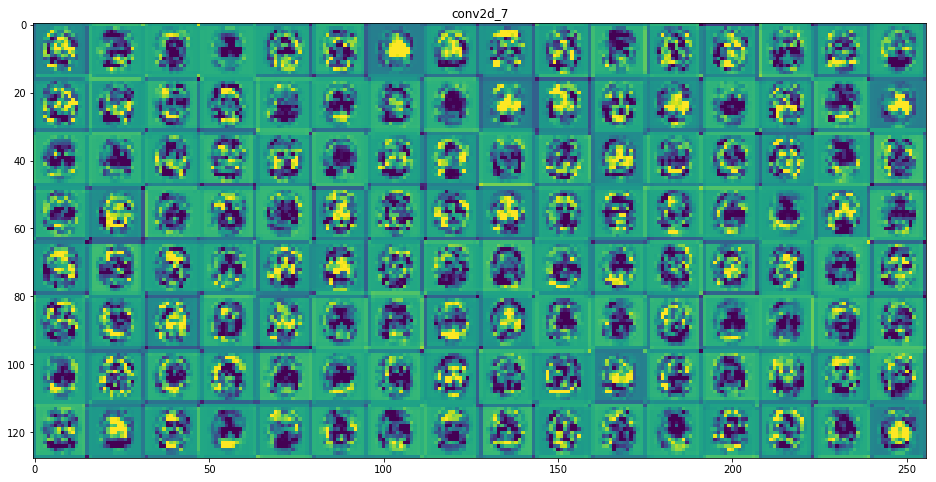

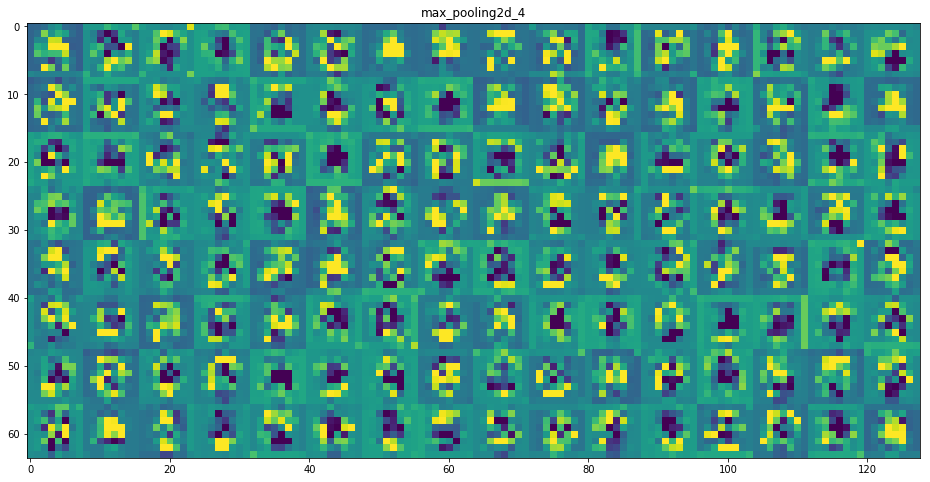

In [46]:
model, history = load_model_history('densenet_keras')
visual_convnet_learn(model)

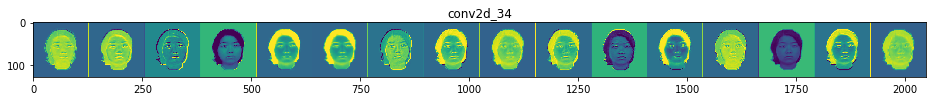

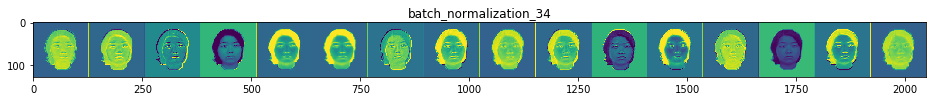

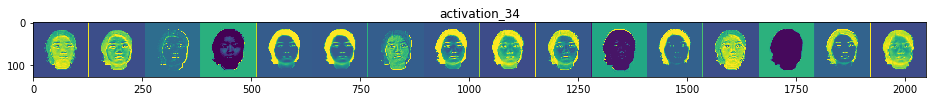

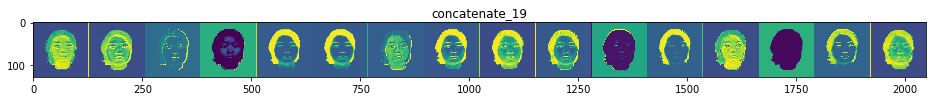

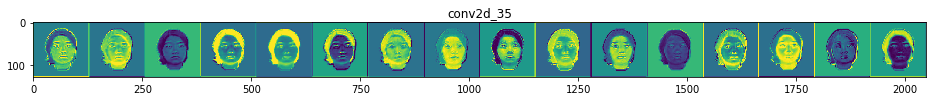

...

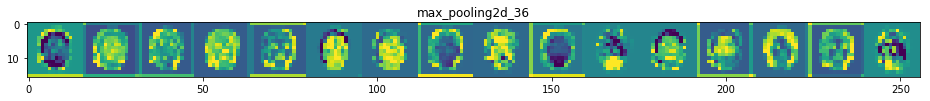

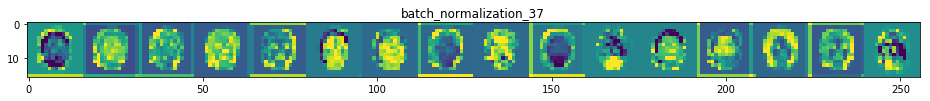

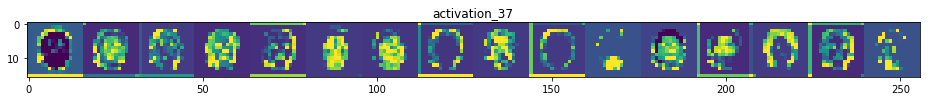

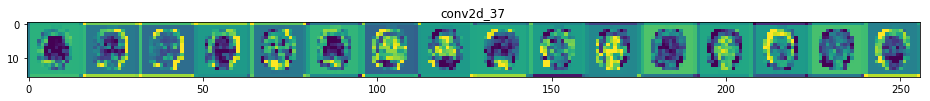

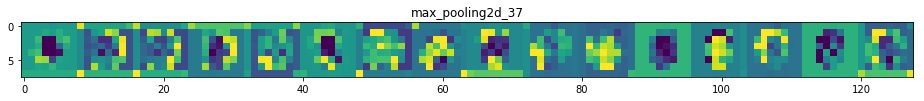

In [47]:
model, history = load_model_history('densenet_keras_reduced3')
visual_convnet_learn(model)

## Visualizing heatmaps of class activation

In [48]:
image_path = '../../data/Asian/AF0301_1100_00F.jpg'

img = image.load_img(image_path, target_size=(128, 128))
img_tensor = np.expand_dims(image.img_to_array(img), axis=0) / 255

In [49]:
def show_heatmap(model, img, layer_name):
    model.predict(img)
    img_output = model.output[:, 0]
    last_conv_layer = model.get_layer(layer_name)
    grads = K.gradients(img_output, last_conv_layer.output)[0]
    pooled_grads = K.mean(grads, axis=(0, 1, 2))
    iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])
    pooled_grads_value, conv_layer_output_value = iterate([img])
    for i in range(grads.shape[3]):
        conv_layer_output_value[:, :, i] *= pooled_grads_value[i]
    heatmap = np.mean(conv_layer_output_value, axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    plt.matshow(heatmap)

/home/cugtyt/software/miniconda3/lib/python3.6/site-packages/keras/models.py:291: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


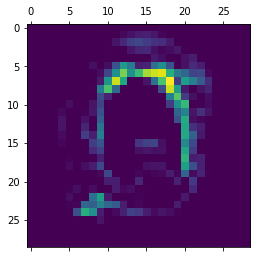

In [50]:
model, history = load_model_history('vanilla_adam_keras')
show_heatmap(model, img_tensor, 'conv2d_21')

In [ ]:
# model, history = load_model_history('resnet_keras')
# show_heatmap(model, img_tensor, 'dense_2')

/home/cugtyt/software/miniconda3/lib/python3.6/site-packages/keras/models.py:291: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


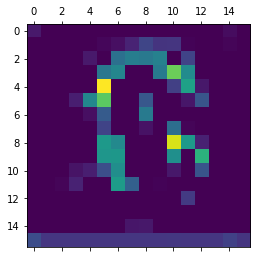

In [51]:
model, history = load_model_history('densenet_keras')
show_heatmap(model, img_tensor, 'conv2d_7')